In [357]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline
from scipy.sparse import lil_matrix
from scipy.sparse.linalg import spsolve



#   Task 1

Text(0.5, 1.0, 'tattoo')

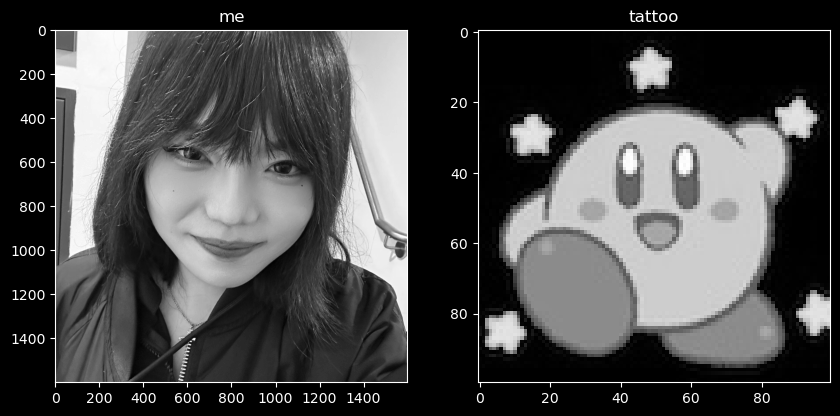

In [358]:
# 读取图像
img1 = cv2.imread('me.jpg')
img2 = cv2.imread('tattoo.jpg')

# 将图像转换为灰度图
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1) 
plt.imshow(img1_gray,cmap='gray')
#plt.axis('off') 
plt.title('me')

plt.subplot(1, 2, 2)
plt.imshow(img2_gray,cmap='gray')
#plt.axis('off')
plt.title('tattoo')

Text(0.5, 1.0, 'src_roi')

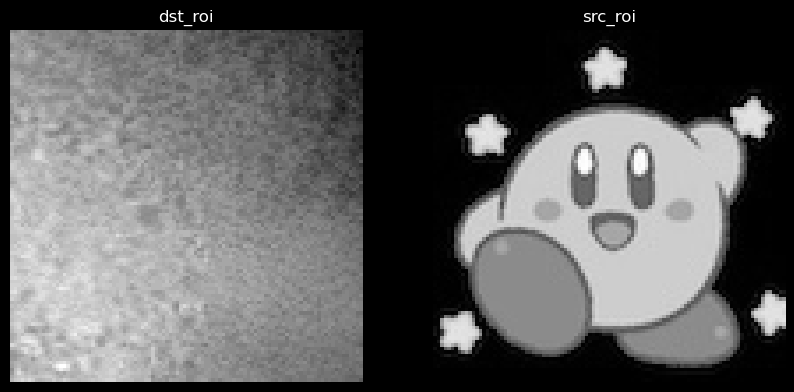

In [359]:
dst_img = img1_gray
src_img = img2_gray

dst_top_left = (1000,750)
dst_bottom_right = (1100,850)
src_top_left = (0, 0)
src_bottom_right = (100, 100)

# dst_top_left = (850,650)
# dst_bottom_right = (1150,950)
# src_top_left = (0, 0)
# src_bottom_right = (300, 300)

dst_roi = dst_img[dst_top_left[1]:dst_bottom_right[1], dst_top_left[0]:dst_bottom_right[0]]
src_roi = src_img[src_top_left[1]:src_bottom_right[1], src_top_left[0]:src_bottom_right[0]]

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1) 
plt.imshow(dst_roi,cmap='gray')
plt.axis('off') 
plt.title('dst_roi')
plt.subplot(1, 2, 2)
plt.imshow(src_roi,cmap='gray')
plt.axis('off')
plt.title('src_roi')


In [360]:
h, w = 100,100
#h, w = 300,300
# 初始化系数矩阵
A = lil_matrix((h * w, h * w))
# 填充系数矩阵
for i in range(h):
    for j in range(w):
        index = i * w + j
        A[index, index] = 4  # 当前像素的系数
        #"当前像素的系数"指的是方程中该像素自己的系数。
        # 在泊松方程中，这通常是4。
        # 这是因为在泊松方程的离散化过程中，每个像素点的值是由它自己和它的四个直接邻居（上、下、左、右）的值共同决定的。
        # 在系数矩阵中，每个像素对应的行中，该像素自己的位置会被赋值为4，而它的四个邻居则分别赋值为-1。这样构建的矩阵用于表示图像中每个像素点与其邻域的拉普拉斯关系
        if i > 0:
            A[index, index - w] = -1  # 上方像素
        if i < h - 1:
            A[index, index + w] = -1  # 下方像素
        if j > 0:
            A[index, index - 1] = -1  # 左侧像素
        if j < w - 1:
            A[index, index + 1] = -1  # 右侧像素

# 将系数矩阵转换为CSR格式，以便后续计算
A_csr = A.tocsr()
A.shape


(10000, 10000)

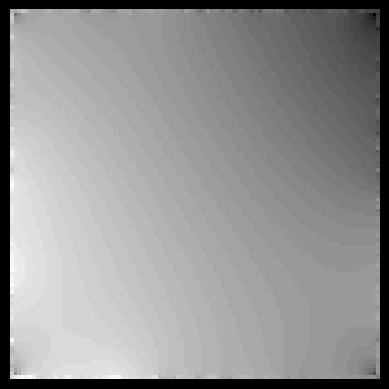

In [361]:
import numpy as np
from scipy.sparse import lil_matrix
from scipy.sparse.linalg import spsolve

# 假设src_roi和dst_roi是NumPy数组，它们是区域R内的源和目标灰度值
h, w = src_roi.shape  # 获取区域R的高度和宽度

# 初始化系数矩阵A和向量b
A = lil_matrix((h * w, h * w))
b = np.zeros(h * w)

# 构建系数矩阵A和向量b
for y in range(h):
    for x in range(w):
        index = x + y * w  # 二维到一维的映射
        # 填充系数矩阵A
        A[index, index] = 4  # 中心像素
        if x > 0:
            A[index, index - 1] = -1  # 左侧像素
        if x < w - 1:
            A[index, index + 1] = -1  # 右侧像素
        if y > 0:
            A[index, index - w] = -1  # 上方像素
        if y < h - 1:
            A[index, index + w] = -1  # 下方像素

        # 设置向量b的边界条件
        if y == 0 or y == h-1 or x == 0 or x == w-1:
            b[index] = dst_roi[y, x]  # 使用目标图像的边界值
        else:
            # 对于内部点，b[index]应当设置为拉普拉斯算子的离散近似，这里为0
            b[index] = 0

# 转换系数矩阵A为CSR格式
A_csr = A.tocsr()

# 求解泊松方程
solution = spsolve(A_csr, b)

# 将求解的结果映射回二维图像
solution_img = solution.reshape((h, w))

# 在目标图像dst_roi中填充求解得到的结果
for y in range(h):
    for x in range(w):
        if not (y == 0 or y == h-1 or x == 0 or x == w-1):  # 对非边界点进行填充
            dst_roi[y, x] = solution_img[y, x]

# 请替换此部分以在您的环境中显示或保存结果
# 例如，使用matplotlib显示结果
import matplotlib.pyplot as plt
plt.imshow(dst_roi, cmap='gray')
plt.axis('off')  # 不显示坐标轴
plt.show()


(10000,)

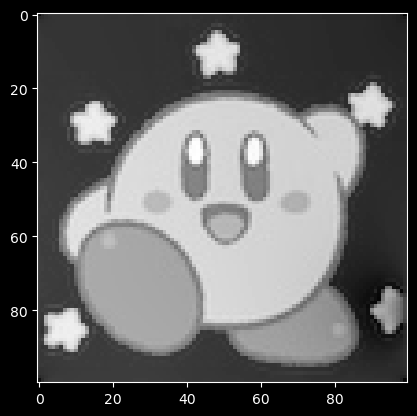

In [197]:
# 初始化右侧向量b
b = np.zeros(h * w)

# 对于边界上的像素，设置b向量为目标图像的像素值
for i in range(h):
    for j in range(w):
        index = i * w + j  # 将二维索引转换为一维索引
        if i == 0 or i == h-1 or j == 0 or j == w-1:
            # 在边界上，使用目标图像的像素值
            b[index] = dst_roi[i, j]
        else:
            # 在内部，计算源图像的梯度并将其添加到b向量
            # 注意：这里简化了梯度计算；实际应用中可能需要更精细的处理
            b[index] = 4 * src_roi[i, j] - src_roi[i, j+1] - src_roi[i, j-1] - src_roi[i+1, j] - src_roi[i-1, j]

# 求解方程组
result = spsolve(A_csr, b)

# 将求解结果映射回图像
# 将一维结果转换为二维图像格式

result_img = result.reshape(h, w)
plt.imshow(result_img,cmap='gray')
result.shape

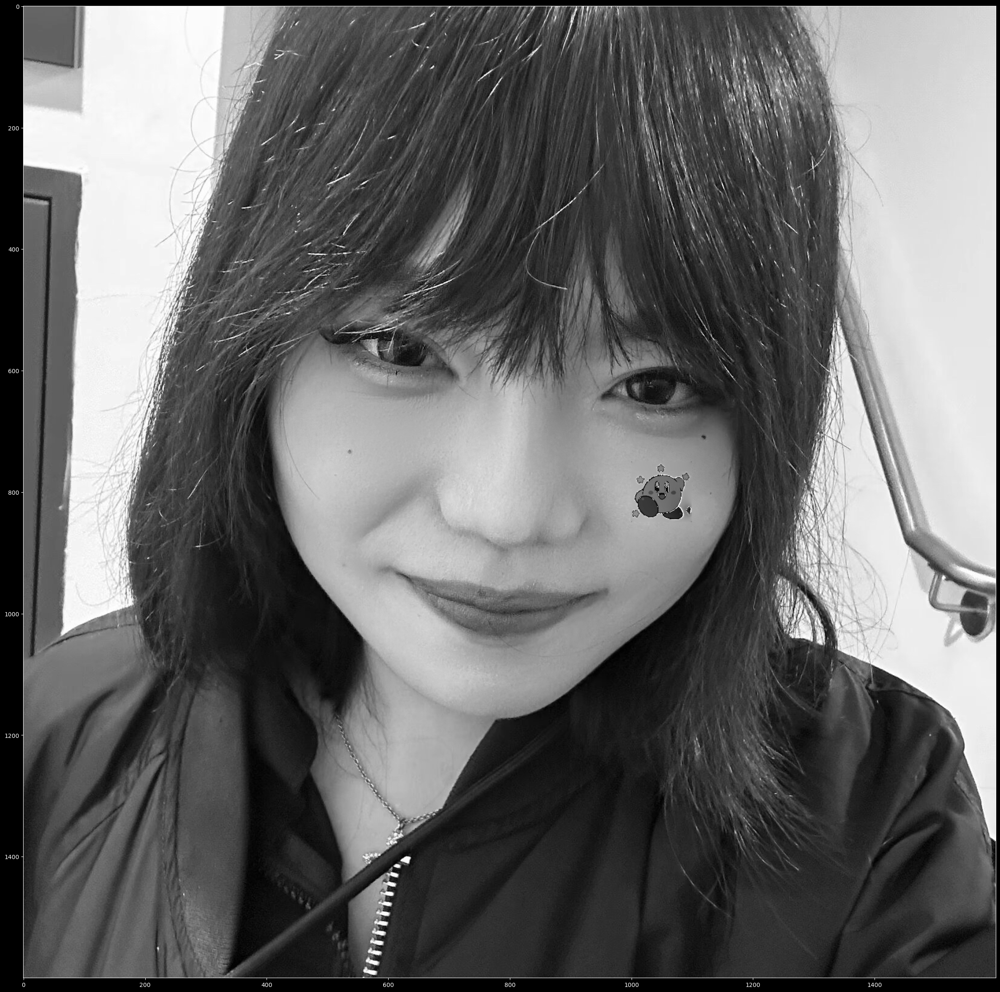

In [198]:
dst_img[dst_top_left[1]:dst_bottom_right[1], dst_top_left[0]:dst_bottom_right[0]] = result_img
plt.figure(figsize=(30,30))
plt.imshow(dst_img,cmap='gray')

从图1和图2的效果来看，当选定区域增大时，泊松编辑的效果有所不同：

1. **图1**（放大区域）：纹身图案显得比较模糊，这可能是因为在更大的区域内，边缘的细节在梯度计算和融合过程中丢失了。

2. **图2**（原始区域大小）：纹身图案更清晰，细节保留得更好，这表明在较小的区域内泊松编辑能更好地保持源图像的特征。

这种情况可能是因为在较大的区域内，源图像的细节和梯度信息在整个区域内分布得更加稀疏，导致在求解泊松方程时，无法有效地保留这些细节。此外，如果边界条件没有正确处理，那么在较大的区域内，这些边界效应可能会对整个编辑区域产生更大的影响。

# Task2

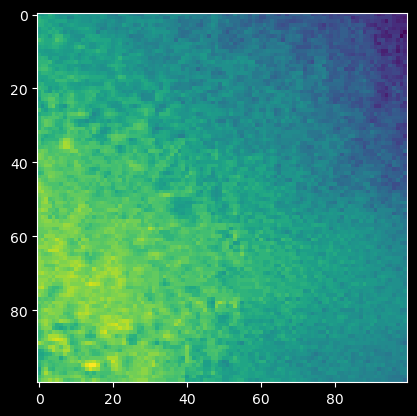

In [324]:
# 读取图像
img1 = cv2.imread('me.jpg')
img2 = cv2.imread('tattoo.jpg')

# 将图像转换为灰度图
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

dst_img = img1_gray
src_img = img2_gray

dst_top_left = (1000,750)
dst_bottom_right = (1100,850)
src_top_left = (0, 0)
src_bottom_right = (100, 100)


dst_roi = dst_img[dst_top_left[1]:dst_bottom_right[1], dst_top_left[0]:dst_bottom_right[0]]
src_roi = src_img[src_top_left[1]:src_bottom_right[1], src_top_left[0]:src_bottom_right[0]]
plt.imshow(dst_roi)

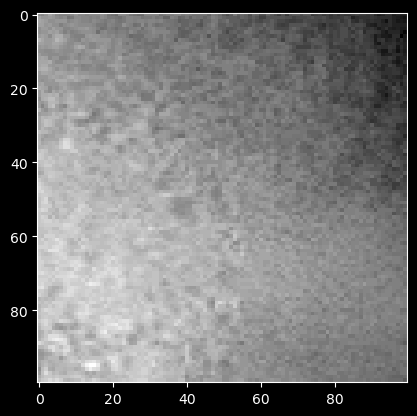

In [325]:
plt.imshow(dst_roi,cmap='gray')
src_roi = src_roi.astype(np.float32)
dst_roi = dst_roi.astype(np.float32)
# mixed_gradient = np.zeros_like(src_roi, dtype=np.float32)
# for i in range(1, h - 1):
#     for j in range(1, w - 1):
#         src_grad = src_roi[i, j] - src_roi[i, j - 1]
#         dst_grad = dst_roi[i, j] - dst_roi[i, j - 1]
#         mixed_gradient[i, j] = max(abs(src_grad), abs(dst_grad)) * np.sign(src_grad)


# # 将数据类型转换为np.uint8以用于灰度图像

# # 现在，b向量将使用混合梯度
# b = mixed_gradient.flatten()

# # 求解方程组
# result = spsolve(A_csr, b)


# # 将求解结果映射回图像
# # 将一维结果转换为二维图像格式

# result_img = result.reshape(h, w)
# result_img_normalized = (result_img - result_img.min()) / (result_img.max() - result_img.min())
# result_img = (result_img_normalized * 255).astype(np.uint8)

# plt.imshow(result_img,cmap='gray')


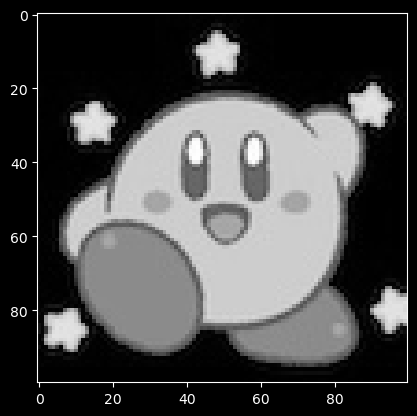

In [326]:
plt.imshow(src_roi,cmap='gray')

In [327]:
# import numpy as np
# from scipy.sparse.linalg import spsolve
# from scipy.sparse import lil_matrix

# # ...之前代码的初始化部分...

# # 计算混合梯度
# for i in range(1, h - 1):
#     for j in range(1, w - 1):
#         index = i * w + j
#         # 计算梯度
#         src_grad_x = src_roi[i, j] - src_roi[i, j - 1]
#         src_grad_y = src_roi[i, j] - src_roi[i - 1, j]
#         dst_grad_x = dst_roi[i, j] - dst_roi[i, j - 1]
#         dst_grad_y = dst_roi[i, j] - dst_roi[i - 1, j]
        
#         # 选择较大的梯度
#         if abs(src_grad_x) > abs(dst_grad_x):
#             grad_x = src_grad_x
#         else:
#             grad_x = dst_grad_x
        
#         if abs(src_grad_y) > abs(dst_grad_y):
#             grad_y = src_grad_y
#         else:
#             grad_y = dst_grad_y
        
#         # 计算混合梯度
#         b[index] = grad_x + grad_y

# # 边界像素处理
# for i in [0, h - 1]:
#     for j in range(w):
#         b[i * w + j] = dst_roi[i, j]

# for j in [0, w - 1]:
#     for i in range(1, h - 1):
#         b[i * w + j] = dst_roi[i, j]

# # 转换A为CSR格式
# A_csr = A.tocsr()

# # 求解线性方程组
# result = spsolve(A_csr, b)

# # 将求解结果映射回目标图像
# result_img = result.reshape(h, w)
# result_img_normalized = (result_img - result_img.min()) / (result_img.max() - result_img.min())
# result_img_uint8 = (result_img_normalized * 255).astype(np.uint8)

# # 将结果插入到目标图像的ROI区域
# dst_img[dst_top_left[1]:dst_bottom_right[1], dst_top_left[0]:dst_bottom_right[0]] = result_img_uint8

# # ...显示结果的代码...


In [328]:
# for i in range(h):
#     for j in range(w):
#         index = i * w + j
#         # 对于非边界像素，计算混合梯度
#         if 0 < i < h-1 and 0 < j < w-1:
#             # 使用公式(9)到(11)中描述的方法计算混合梯度
#             v_pq = src_roi[i, j] - src_roi[i, j - 1]
#             v_pq_right = src_roi[i, j] - src_roi[i, j + 1]
#             v_pq_down = src_roi[i, j] - src_roi[i + 1, j]
#             v_pq_up = src_roi[i, j] - src_roi[i - 1, j]
#             v_pq_left = src_roi[i, j] - src_roi[i, j - 1]

#             # 选择最大的梯度
#             v_pq = v_pq if abs(v_pq) > abs(dst_roi[i, j] - dst_roi[i, j - 1]) else dst_roi[i, j] - dst_roi[i, j - 1]
#             v_pq_right = v_pq_right if abs(v_pq_right) > abs(dst_roi[i, j] - dst_roi[i, j + 1]) else dst_roi[i, j] - dst_roi[i, j + 1]
#             v_pq_down = v_pq_down if abs(v_pq_down) > abs(dst_roi[i, j] - dst_roi[i + 1, j]) else dst_roi[i, j] - dst_roi[i + 1, j]
#             v_pq_up = v_pq_up if abs(v_pq_up) > abs(dst_roi[i, j] - dst_roi[i - 1, j]) else dst_roi[i, j] - dst_roi[i - 1, j]
#             v_pq_left = v_pq_left if abs(v_pq_left) > abs(dst_roi[i, j] - dst_roi[i, j - 1]) else dst_roi[i, j] - dst_roi[i, j - 1]

#             # 将混合梯度赋值给b向量
#             b[index] = v_pq + v_pq_right + v_pq_down + v_pq_up + v_pq_left
#         else:
#             # 边界像素使用目标图像的像素值
#             b[index] = dst_roi[i, j] 
        
# # 将系数矩阵转换为CSR格式，以便后续计算
# A_csr = A.tocsr()

# # 求解方程组
# result = spsolve(A_csr, b)

# # 将求解结果映射回目标图像
# result_img = result.reshape(h, w)
# # 标准化结果
# result_img_normalized = (result_img - result_img.min()) / (result_img.max() - result_img.min())
# result_img_uint8 = (result_img_normalized * 255).astype(np.uint8)
# plt.imshow(result_img,cmap='gray')


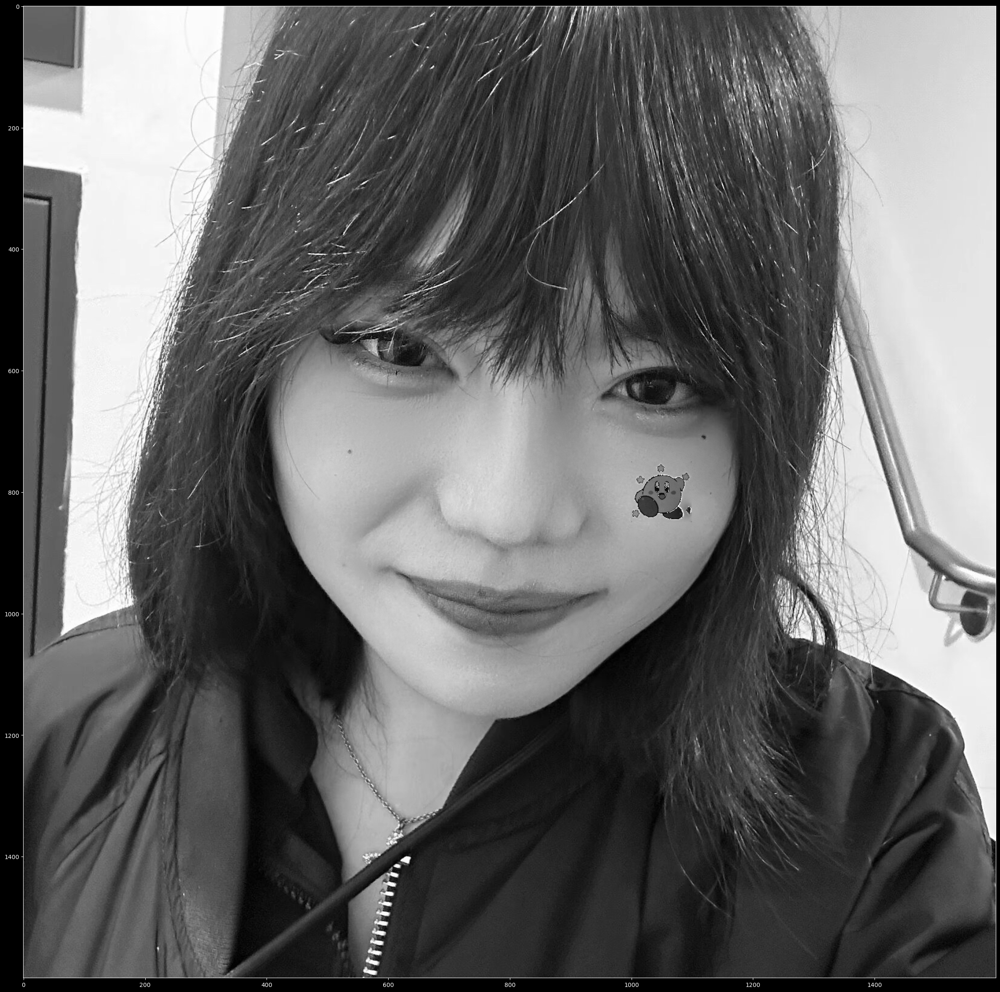

In [336]:
# ...之前代码的初始化部分...

# 计算梯度
src_gradient_x = np.diff(src_roi.astype(np.float32), axis=1, append=0)
src_gradient_y = np.diff(src_roi.astype(np.float32), axis=0, append=0)
dst_gradient_x = np.diff(dst_roi.astype(np.float32), axis=1, append=0)
dst_gradient_y = np.diff(dst_roi.astype(np.float32), axis=0, append=0)

# 初始化混合梯度
mixed_gradient_x = np.zeros_like(src_roi, dtype=np.float32)
mixed_gradient_y = np.zeros_like(src_roi, dtype=np.float32)

# 对于内部像素，选择较大的梯度
for i in range(h):
    for j in range(w):
        if abs(src_gradient_x[i, j]) > abs(dst_gradient_x[i, j]):
            mixed_gradient_x[i, j] = src_gradient_x[i, j]
        else:
            mixed_gradient_x[i, j] = dst_gradient_x[i, j]
        
        if abs(src_gradient_y[i, j]) > abs(dst_gradient_y[i, j]):
            mixed_gradient_y[i, j] = src_gradient_y[i, j]
        else:
            mixed_gradient_y[i, j] = dst_gradient_y[i, j]

# 计算散度，这是梯度场的点源
div_mixed_gradient = np.zeros_like(src_roi, dtype=np.float32)
for i in range(1, h-1):
    for j in range(1, w-1):
        v_pq = mixed_gradient_x[i, j-1]
        v_qp = -mixed_gradient_x[i, j]
        u_pq = mixed_gradient_y[i-1, j]
        u_qp = -mixed_gradient_y[i, j]
        div_mixed_gradient[i, j] = v_pq + v_qp + u_pq + u_qp

# 应用边界条件
for i in range(h):
    for j in range(w):
        index = i * w + j
        if i == 0 or i == h-1 or j == 0 or j == w-1:
            div_mixed_gradient[i, j] += dst_roi[i, j]

# 将散度应用到b向量
b = div_mixed_gradient.flatten()


# 将系数矩阵转换为CSR格式，以便后续计算
A_csr = A.tocsr()

# 求解方程组
result = spsolve(A_csr, b)

# 将求解结果映射回目标图像
result_img = result.reshape(h, w)

# # 请确保在映射回目标图像前，将result_img的值限制在合理的范围内
result_img_clipped = np.clip(result_img, 0, 255)
# 标准化结果
# result_img_normalized = (result_img - result_img.min()) / (result_img.max() - result_img.min())
# result_img_uint8 = (result_img_normalized * 255).astype(np.uint8)



# 现在，我们可以将uint8类型的结果映射回目标图像的ROI区域
dst_img[dst_top_left[1]:dst_bottom_right[1], dst_top_left[0]:dst_bottom_right[0]] = result_img.astype(np.uint8)
#dst_img[dst_top_left[1]:dst_bottom_right[1], dst_top_left[0]:dst_bottom_right[0]] = result_img_uint8
plt.figure(figsize=(30,30))
# plt.imshow(dst_img,cmap='gray')
plt.imshow(dst_img,cmap='gray')

In [330]:
# # 计算源图像和目标图像的梯度
# src_gradient_x = np.diff(src_roi, axis=1, append=src_roi[:, -1:])
# src_gradient_y = np.diff(src_roi, axis=0, append=src_roi[-1:, :])
# dst_gradient_x = np.diff(dst_roi, axis=1, append=dst_roi[:, -1:])
# dst_gradient_y = np.diff(dst_roi, axis=0, append=dst_roi[-1:, :])

# # 初始化混合梯度
# mixed_gradient = np.zeros_like(src_roi, dtype=np.float32)

# # 选择最大的梯度
# for i in range(h):
#     for j in range(w):
#         if abs(src_gradient_x[i, j]) > abs(dst_gradient_x[i, j]):
#             mixed_gradient[i, j] += src_gradient_x[i, j]
#         else:
#             mixed_gradient[i, j] += dst_gradient_x[i, j]
        
#         if abs(src_gradient_y[i, j]) > abs(dst_gradient_y[i, j]):
#             mixed_gradient[i, j] += src_gradient_y[i, j]
#         else:
#             mixed_gradient[i, j] += dst_gradient_y[i, j]

# # 计算混合梯度的散度
# div_mixed_gradient = np.diff(mixed_gradient, axis=1, prepend=mixed_gradient[:, 0:1])
# div_mixed_gradient += np.diff(mixed_gradient, axis=0, prepend=mixed_gradient[0:1, :])

# # 应用边界条件
# for i in range(h):
#     for j in range(w):
#         index = i * w + j
#         if i == 0 or i == h-1 or j == 0 or j == w-1:
#             div_mixed_gradient[i, j] = dst_roi[i, j]

# # 将混合梯度的散度应用到b向量
# b = div_mixed_gradient.flatten()

# # 将系数矩阵转换为CSR格式，以便后续计算
# A_csr = A.tocsr()

# # 求解方程组
# result = spsolve(A_csr, b)

# # 将求解结果映射回目标图像
# result_img = result.reshape(h, w)
# # 标准化结果
# result_img_normalized = (result_img - result_img.min()) / (result_img.max() - result_img.min())
# result_img_uint8 = (result_img_normalized * 255).astype(np.uint8)
# plt.imshow(result_img,cmap='gray')


In [331]:
# dst_img[dst_top_left[1]:dst_bottom_right[1], dst_top_left[0]:dst_bottom_right[0]] = result_img_uint8
# plt.figure(figsize=(30,30))
# plt.imshow(dst_img,cmap='gray')